### about this file
this file helps to plot and compare between different return series

- Section 2 and 3 are plot for factor return

- Section 4 are plots for portfolio return

- Section 5 are plots for sector return

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
mdict = pd.read_csv(r'.\input\code_mapping.csv').set_index('code').to_dict()['name']

In [3]:
def add_bar_labels(ax, formatter, spacing = 3):
    """adding data labels to bar plots"""
    i = 0
    for rect in ax.patches:
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2
        space = spacing
        va = 'bottom'
        if y_value <0:
            space *= -1
            va = 'top'
        label = formatter.format(y_value)
        ax.annotate(label, 
                    (x_value, y_value),
                    xytext=(0, space),
                    textcoords = "offset points",
                    ha="center",
                    va=va,
                   fontsize = 10)
        i += 1

In [4]:
def read_factor(code, filename = r".\input\factor\ten_factor_vw_{}_5.csv"):
    """reading monthly factor return, converting market return to excess market return"""
    data = pd.read_csv(filename.format(code), index_col=0)
    data.index = pd.to_datetime(data.index, format="%Y-%m")
    data["mkt"] = data["market"] - data["rf"]
    return(data)

In [5]:
def cal_jensen(ret, code):
    """
    calculate Jensen's alpha for a return series. 
    ret denotes the return series and code is the country code for market return
    returns Jensen's alpha and its p-value
    """
    import statsmodels.api as sm
    # independent variable
    Y = pd.DataFrame(ret)
    Y = Y.dropna(how='any')
    
    # get market excess return
    df = pd.read_csv(r".\input\factor\ten_factor_vw_{}_week_5.csv".format(code), index_col=0)
    df.index = pd.to_datetime(df.index, format="%Y-%m-%d" if "-" in df.index[0] else "%d/%m/%Y")
    df['const'] = 1
    X = df.loc[Y.index, ['exmkt','const']]
    Y = Y.iloc[:,0] - df.loc[Y.index, "rf"]
    
    
    res = sm.OLS(Y, X).fit()
    alpha_p = res.pvalues['const']
    alpha = res.params['const']*52 # annualized
    return alpha, alpha_p

In [6]:
def factor_sum_plot(data, top_weights, factornames, 
                    fig_title, fig_path, save_fig = True, 
                    periods = 52, horizons = (1, 3, 1), 
                    bm_code = None, top = False, **kwargs):
    """
    this factor plots 5 plots: 
    a. annualized return of two horizons
    b. annualized sharpe ratio of two horizons
    c. annualized alpha of two horizons (if bm_code is provided)
    d. cumulative return over a horizon
    e. rolling 52-week return over a horizon the same as cumulative return
    f. maximum weighting over a horizon (if top=True)
    periods denote the data points per year, this should be set to 52 if using weekly data
    horizon denote the time horizon of the graphs, eg. (1,3,1) means two horizons for plots a, b, c and the horizon for plots d, e
    bm_code denote the country of which market return is used to calculate Jensen's alpha
    """
    
    ann_ret = lambda x: np.mean(x)*periods
    ann_vol = lambda x: x.std()*(periods**0.5)
    sr = lambda x: ann_ret(x)/ann_vol(x)
    
    # set grid layout
    plt.style.use('seaborn')
    if bm_code == None:
        fig = plt.figure(num=1, figsize=(26,12)) #gridspec_kw = {'height_ratios':[1, 4]}, 
        gs = gridspec.GridSpec(2,2, width_ratios = [1, 1.3])
        ax1 = fig.add_subplot(gs[0,0])
        ax2 = fig.add_subplot(gs[1,0])
        ax3 = fig.add_subplot(gs[0,1])
        ax4 = fig.add_subplot(gs[1,1])
    else:
        fig = plt.figure(num=1, figsize=(26,15)) #gridspec_kw = {'height_ratios':[1, 4]}, 
        gs = gridspec.GridSpec(3,2, width_ratios = [1, 1.3])
        ax1 = fig.add_subplot(gs[0,0])
        ax2 = fig.add_subplot(gs[1,0])
        ax5 = fig.add_subplot(gs[2,0])
        ax3 = fig.add_subplot(gs[0,1])
        ax4 = fig.add_subplot(gs[1,1])
        ax6 = fig.add_subplot(gs[2,1])
    
    h1, h2, h3 = horizons    
    # upper left graph: annualized return in the past 12 months (52 weeks) and past 36 months (156 weeks)
    pd.concat([data.iloc[-h1*periods:,:].apply(ann_ret).rename("last 12 months"),
               data.iloc[-h2*periods:,:].apply(ann_ret).rename("last 36 months")]
              , axis=1).T.plot.bar(ax = ax1, rot=1, width=0.9, colormap="Paired", fontsize = 12)
    add_bar_labels(ax1, "{:.1%}")
    ax1.legend(factornames, ncol=1, loc="center left", bbox_to_anchor = (1, 0.5), fontsize = 12)
    xtick1 = [" - ".join([data.index[-h1*periods].strftime("%Y/%m"),data.index[-1].strftime("%Y/%m")])]
    xtick1.append(" - ".join([data.index[-h2*periods].strftime("%Y/%m"),data.index[-1].strftime("%Y/%m")]))
    ax1.set_xticklabels(xtick1)
    ax1.set_title("Annualized Return", size = 16)

    # middle left graph: annualized sharpe ratio in the past 12 months (52 weeks) and past 36 months (156 weeks)
    pd.concat([data.iloc[-h1*periods:,:].apply(sr).rename("last year"),
               data.iloc[-h2*periods:,:].apply(sr).rename("last 3 years")]
              , axis=1).T.plot.bar(ax = ax2, rot=1, width=0.9, colormap="Paired", fontsize = 12)
    
    ax2.legend(factornames, ncol=1, loc="center left", bbox_to_anchor = (1, 0.5),  fontsize = 12)
    xtick2 = [" - ".join([data.index[-h1*periods].strftime("%Y/%m"),data.index[-1].strftime("%Y/%m")])]
    xtick2.append(" - ".join([data.index[-h2*periods].strftime("%Y/%m"),data.index[-1].strftime("%Y/%m")]))
    ax2.set_xticklabels(xtick2)
    ax2.set_title("Annualized Sharpe Ratio", size = 16)
    for a in ax2.containers: 
            ax2.bar_label(a, fmt='%.2f', label_type='edge', padding = 3)
         
    # bottom left: jensen's alpha
    if bm_code != None:
        # calculate alpha
        alpha1 = data.iloc[-h1*periods:,:].apply(cal_jensen, args=(bm_code,))  
        alpha2 = data.iloc[-h2*periods:,:].apply(cal_jensen, args=(bm_code,))
        pd.concat([alpha1.iloc[0,:],alpha2.iloc[0,:]], axis =1).T.plot.bar(ax = ax5, rot=1, width=0.9, colormap="Paired", fontsize = 12)
        ax5.set_xticklabels(xtick2)
        add_bar_labels(ax5, "{:.1%}")
        ax5.set_title("Annualized Alpha", size = 16)
        ax5.legend(factornames, ncol=1, loc="center left", bbox_to_anchor = (1, 0.5), fontsize = 12)
#     for a in ax5.containers: 
#         ax5.bar_label(a, fmt='%.3f', label_type='edge', padding = 3)
    
    # upper right: cumulative return in the past 12 months or 52 weeks
    cum_ret = data.iloc[-h3*periods-1:,:]+1
    cum_ret.iloc[0, :] = np.ones(len(data.columns))
    tick3 = " - ".join([cum_ret.index[-h3*periods].strftime("%Y/%m"),cum_ret.index[-1].strftime("%Y/%m")])
    cum_ret.index = mdates.date2num(cum_ret.index)
    cum_ret.cumprod().plot(ax = ax3, colormap = "Paired", fontsize = 14, grid=True, legend = None, **kwargs)
    ax3.set_xlabel("")
    ax3.set_xlim([data.index[-h3*periods]-pd.Timedelta(days=20),data.index[-1]+pd.Timedelta(days=20)])
    ax3.xaxis.set_major_locator(mdates.MonthLocator(bymonth = (6,12) if h3 >=2 else (3,9,6,12)))
    ax3.set_title("Cumulative Return {}".format(tick3), size = 16)
    ax3.yaxis.set_ticks_position('right')
    
#     for i in range(len(factorcodes)):
#         height = (data[factorcodes].iloc[-5*periods:,:]+1).prod()[i]
#         text = "{:.1%}".format(height)
#         ax3.annotate(xy=[data.index[-1]+pd.Timedelta(days=30), height], xytext = (1,0), 
#                      textcoords = 'offset points', text = text, color="tab:grey", fontsize = 12)
    
    # mid right: rolling 52-week return in the past 12 months or 52 weeks
    cum_ret_roll = (data+1).rolling(window = periods).apply(np.prod) - 1
    cum_ret_roll = cum_ret_roll.iloc[-h3*periods+1:,:]
    tick4 = " - ".join([cum_ret_roll.index[0].strftime("%Y/%m"),cum_ret_roll.index[-1].strftime("%Y/%m")])
    cum_ret_roll.index = mdates.date2num(cum_ret_roll.index)
    cum_ret_roll.plot(ax = ax4, colormap = "Paired", fontsize = 14, grid=True, legend = None, **kwargs)
    ax4.set_xlabel("")
    ax4.set_xlim([data.index[-h3*periods+1]-pd.Timedelta(days=20),data.index[-1]+pd.Timedelta(days=20)])
    ax4.xaxis.set_major_locator(mdates.MonthLocator(bymonth = (6,12) if h3 >=2 else (3,9,6,12)))
    ax4.set_title("Rolling 52-week Return {}".format(tick4), size = 16)
    ax4.yaxis.set_ticks_position('right')
    
    # bottom right: maxi sectors in the allocations
    if top:
        top_weights['EW'] = np.nan
        top_weights['Market'] = np.nan
        limits = [top_weights.index[-h3*periods]-pd.Timedelta(days=20),top_weights.index[-1]+pd.Timedelta(days=20)]
        top_weights.index = mdates.date2num(top_weights.index)
        top_weights.iloc[-h3*periods:].plot(ax=ax6, colormap="Paired", fontsize = 12, legend = None)
        ax6.set_title("Maximum Weighting", size = 16)
        ax6.set_xlim(limits)
        ax6.xaxis.set_major_locator(mdates.MonthLocator(bymonth = (6,12) if h3 >=2 else (3,9,6,12)))
        ax6.yaxis.set_ticks_position('right')
    
    fig.suptitle(fig_title, fontsize = 18)
    fig.tight_layout(rect = [0, 0.03, 1, 0.98])
    
    if save_fig:
        plt.savefig(fig_path, dpi=300)
        print("figure saved at {}".format(fig_path))
    else:
        print("NOTE: figure not saved")
    
    plt.show()

### Weekly Factor Return

In [52]:
factornames = ["Excess\nMarket", "Size", "Value-B2M", "Value-E2P", "Profitability", "Investment", "Momentum", "Reversal",
             "Beta", "Volume",  "Volatility"]
factorcodes = ["mkt", 'size', 'bm', 'ep','roe', 'ag', 'm12', 'm1','beta','idvc', 'dtvm']

In [59]:
def read_factor_weekly(code, format = "%Y-%m-%d"):
    data = pd.read_csv(r'.\input\factor\ten_factor_vw_{}_week_5.csv'.format(code), index_col=0)
    data.index = pd.to_datetime(data.index, format=format)
    del data['rf']
    return(data)

figure saved at .\plots\factor_cn800_5.png


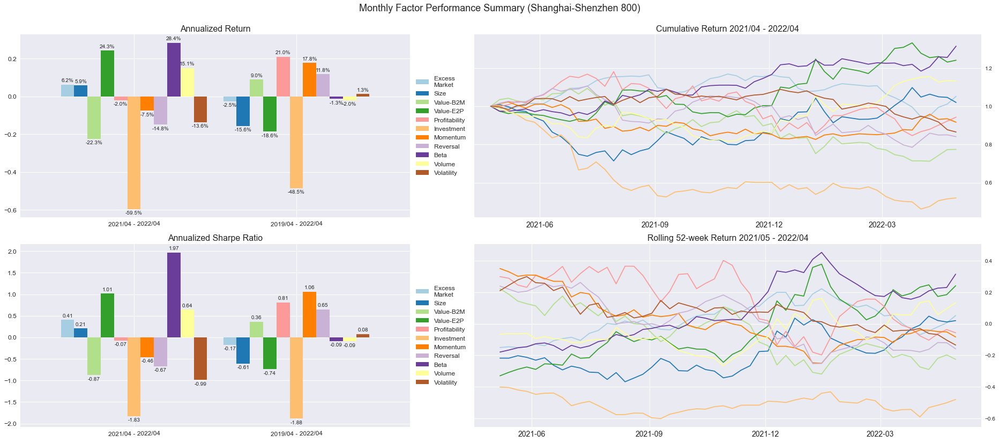

In [60]:
data = read_factor_weekly("cn800", format = "%Y-%m-%d")
factor_sum_plot(data, None, factornames, "Monthly Factor Performance Summary (Shanghai-Shenzhen 800)"
                ,r".\plots\factor_cn800_5.png",  periods = 52)

figure saved at .\plots\factor_hk300_5.png


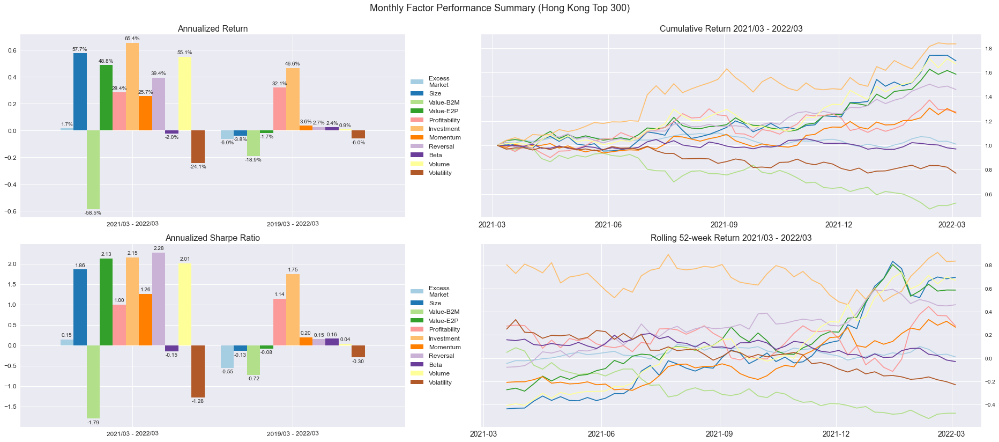

In [26]:
data = read_factor_weekly("hk300", format = "%Y-%m-%d")
factor_sum_plot(data, None, factornames, "Monthly Factor Performance Summary (Hong Kong Top 300)", r".\plots\factor_hk300_5.png", periods = 52)

figure saved at .\plots\factor_hk400_5.png


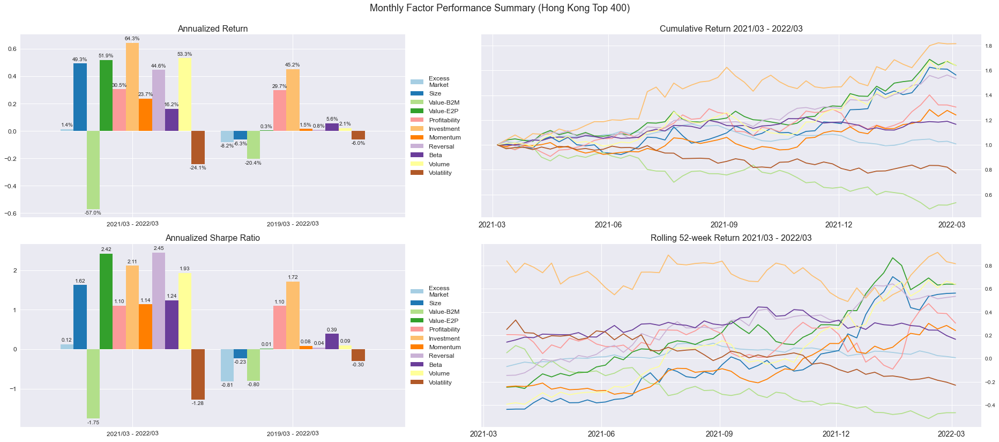

In [27]:
data = read_factor_weekly("hk400", format = "%Y-%m-%d")
factor_sum_plot(data, None, factornames, "Monthly Factor Performance Summary (Hong Kong Top 400)", r".\plots\factor_hk400_5.png", periods = 52)

figure saved at .\plots\factor_us1500_5.png


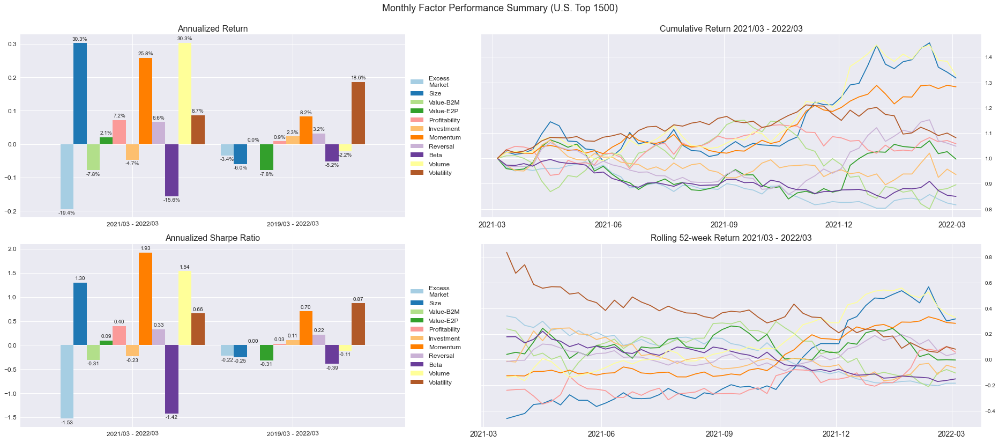

In [28]:
data = read_factor_weekly("us1500", format = "%Y-%m-%d")
factor_sum_plot(data, None, factornames, "Monthly Factor Performance Summary (U.S. Top 1500)", r".\plots\factor_us1500_5.png", periods = 52)

### Weekly Factor Return (Long & Short)

In [61]:
def read_factor_ls(code):
    market = pd.read_csv(r".\input\factor\ten_factor_vw_{}_week_5.csv".format(code), index_col = 0)
    market.index = pd.to_datetime(market.index, format="%Y-%m-%d")
    market = market['exmkt']

    long = pd.read_csv(r".\input\factor\ten_factor_{}_week_{}_5.csv".format(code, "long"), index_col=0)
    long.index = pd.to_datetime(long.index, format="%Y-%m-%d")
    long = pd.concat([long, market], axis = 1)

    short = pd.read_csv(r".\input\factor\ten_factor_{}_week_{}_5.csv".format(code, "short"), index_col=0)
    short.index = pd.to_datetime(short.index, format="%Y-%m-%d")
    short = pd.concat([short, market], axis = 1)
    return long, short

figure saved at .\plots\factor_hk400_long_5


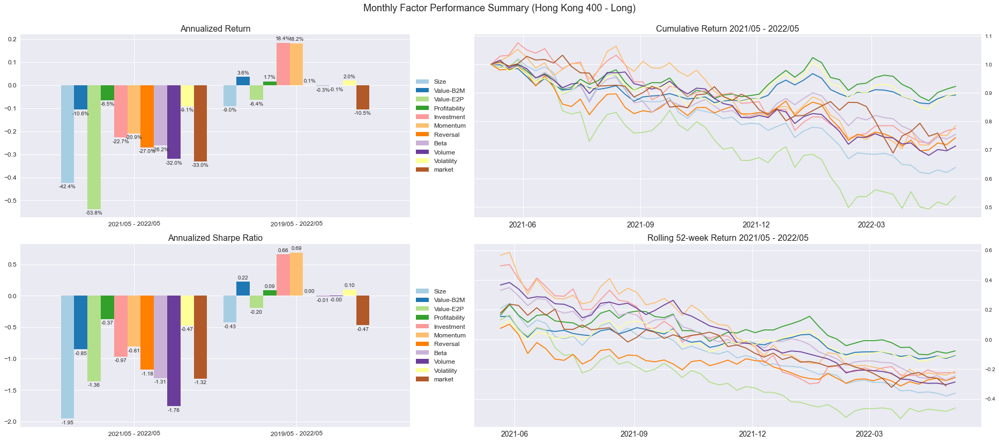

figure saved at .\plots\factor_hk400_short_5


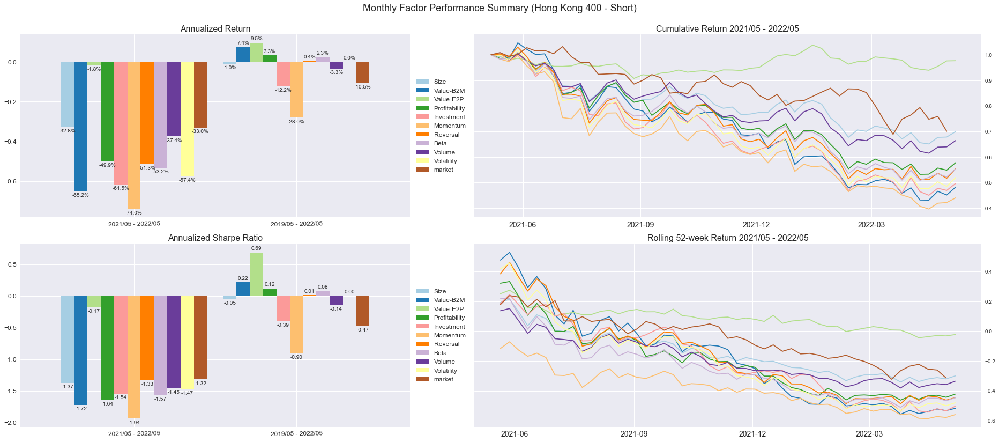

In [62]:
factorname1 = ["Size", "Value-B2M", "Value-E2P", "Profitability", "Investment", "Momentum", "Reversal",
             "Beta", "Volume",  "Volatility", "market"]
factorcode1 = ['size', 'bm', 'ep','roe', 'ag', 'm12', 'm1','beta','idvc', 'dtvm', "market"]

code = "hk400"
long, short = read_factor_ls(code)
factor_sum_plot(long, None, factorname1, "Monthly Factor Performance Summary (Hong Kong 400 - Long)", 
                r".\plots\factor_{}_long_5".format(code), periods = 52)

factor_sum_plot(short, None, factorname1, "Monthly Factor Performance Summary (Hong Kong 400 - Short)", 
                r".\plots\factor_{}_short_5".format(code), periods = 52)

figure saved at .\plots\factor_cn800_long_5


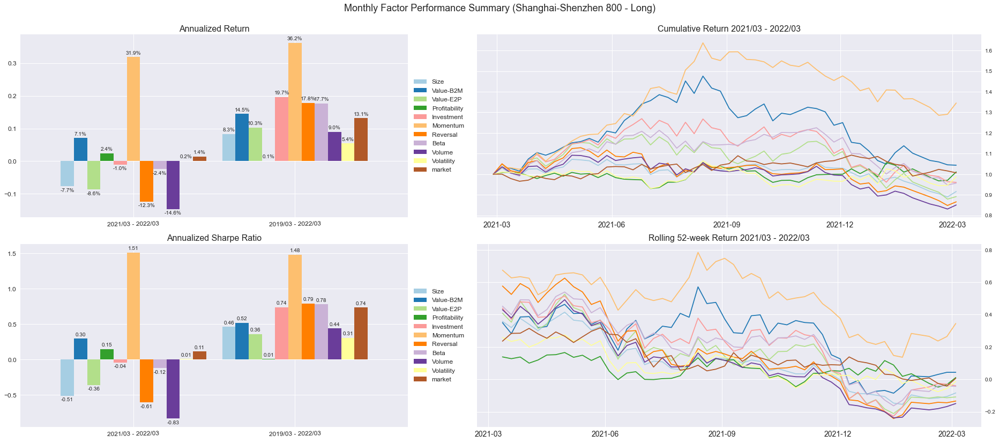

figure saved at .\plots\factor_cn800_short_5


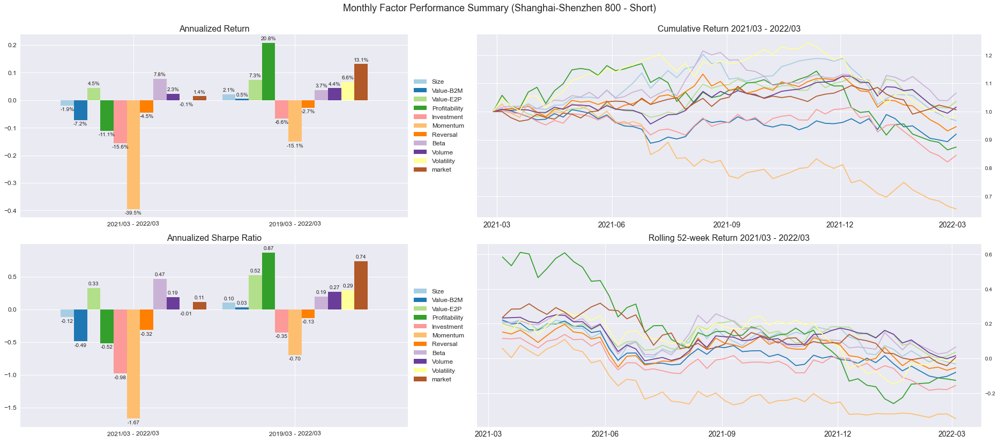

In [33]:
code = "cn800"
long, short = read_factor_ls(code)

factor_sum_plot(long, None, factorname1, "Monthly Factor Performance Summary (Shanghai-Shenzhen 800 - Long)",r".\plots\factor_{}_long_5".format(code), periods = 52)
factor_sum_plot(short, None, factorname1, "Monthly Factor Performance Summary (Shanghai-Shenzhen 800 - Short)",r".\plots\factor_{}_short_5".format(code), periods = 52)

figure saved at .\plots\factor_us1500_long_5


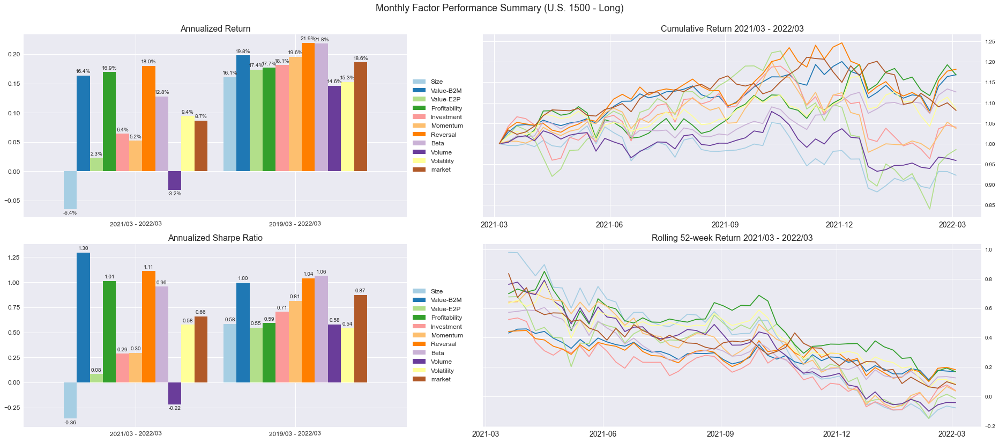

figure saved at .\plots\factor_us1500_short_5


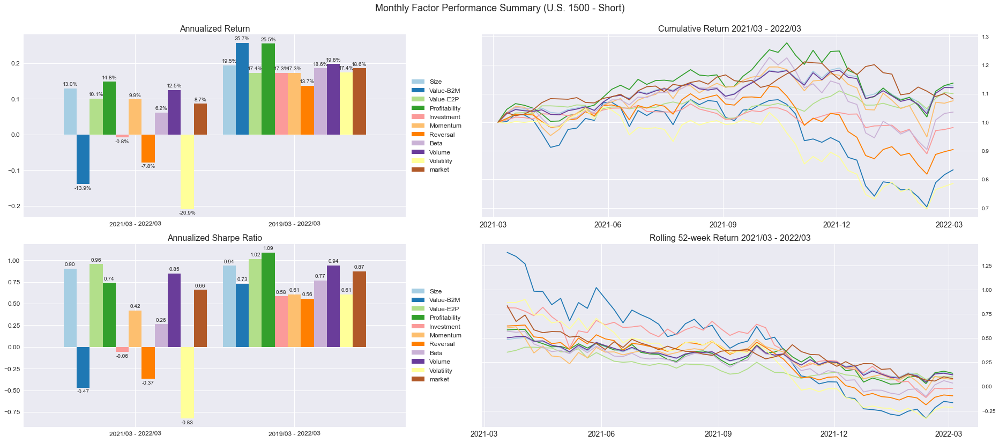

In [34]:
code = "us1500"
long, short = read_factor_ls(code)

factor_sum_plot(long, None, factorname1, "Monthly Factor Performance Summary (U.S. 1500 - Long)",r".\plots\factor_{}_long_5".format(code), periods = 52)
factor_sum_plot(short, None, factorname1, "Monthly Factor Performance Summary (U.S. 1500 - Short)",r".\plots\factor_{}_short_5".format(code), periods = 52)

### Portfolio Performance

In [104]:
# test for b_weight = 1, gamma = 2 and 8 (factor and capm) + market + EW
def get_performances(code, level, methods, gamma_list = [2,8], suffix="e"):
    ls = []
    
    factor_suffix = {'hk':'400', 'cn':'800', 'us':'1500'}
    factor_code = code + factor_suffix[code]
    
    # read in risk free rate return
    data_rf = pd.read_csv(r".\input\factor\ten_factor_vw_{}_week_5.csv".format(factor_code), index_col=0)
    data_rf = data_rf['rf']
    
    for method in methods:
        if "3" in method:
            data = pd.read_csv(rf".\performances\{code}_{level}_{method[:-1]}3.csv", index_col = 0)
        else:
            data = pd.read_csv(rf".\performances\{code}_{level}_{method}{suffix}.csv", index_col = 0)
        data = data[data.gamma_op.isin(gamma_list)]
        data = data.pivot(columns = "gamma_op", values = "0")
        data.columns = ["{}({})".format(method, i) for i in data.columns]
        
        # turn excess return to return
        data = data.join(data_rf, how='left')
        data = data.iloc[:,:len(gamma_list)].add(data.rf, axis=0)
        
        ls.append(data)
    
    # add equally-weighted and market return
    if "3" in method:
        data_ew = pd.read_csv(rf".\performances\{code}_{level}_ew3.csv", index_col = 0)
    else:
        data_ew = pd.read_csv(rf".\performances\{code}_{level}_ew.csv", index_col = 0)
    data_ew.columns = ["ew"]
    ls.append(data_ew)
    df_all = pd.concat(ls, axis = 1)

    data_market = pd.read_csv(rf".\input\factor\ten_factor_vw_{factor_code}_week_5.csv", index_col = 0)

    df_all = df_all.join(data_market["exmkt"])
    df_all.index = pd.to_datetime(df_all.index)
    
    return df_all

In [99]:
def get_top_weight(code, methods):
    weights = pd.read_csv(r".\weights\weekly\{}_quadprog_{}.csv".format(code, method), index_col=0)
    _weights = weights[weights.gamma_op==2].iloc[:,:-1].unstack().reset_index()
    _weights.columns = ['sector', 'date', 'weight']
    _weights = _weights.sort_values('weight').groupby('date').head(3).pivot(index="date", columns="sector", values="weight")
    return _weights
def get_max_weight(code, level, methods, gamma_list=[2,8], suffix="e"):
    ls = []
    for method in methods:
        weights = pd.read_csv(rf".\weights\{code}_{level}_{method}{suffix}.csv", index_col=0)
        for gamma in gamma_list:
            _weights = weights[weights.gamma_op==gamma].iloc[:,:-1]
            series = _weights.max(axis=1)
            series.name = "{}. {}".format("agg" if gamma==2 else "con", method)
            ls.append(series)
    df = pd.concat(ls, axis=1)
    df.index = pd.to_datetime(df.index)
    return df

NOTE: figure not saved


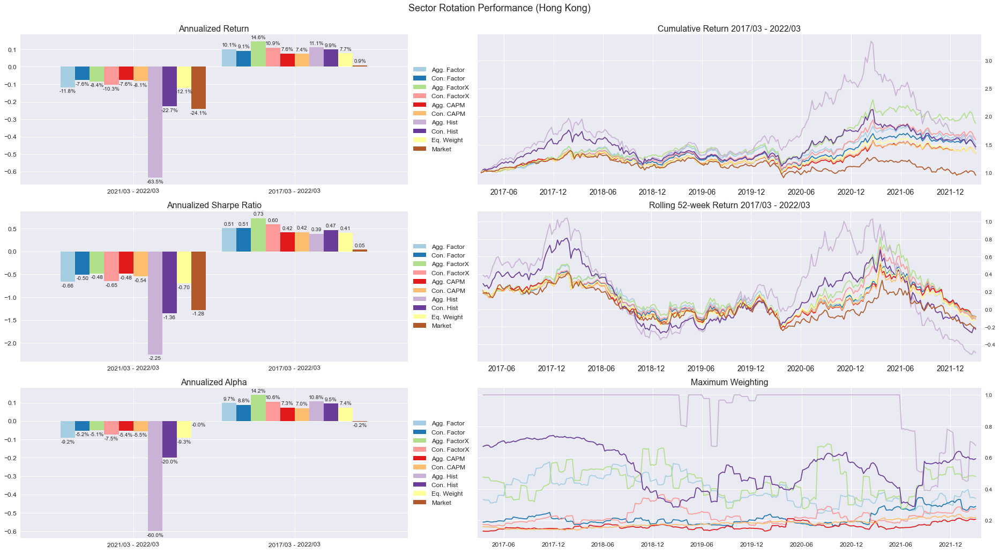

NOTE: figure not saved


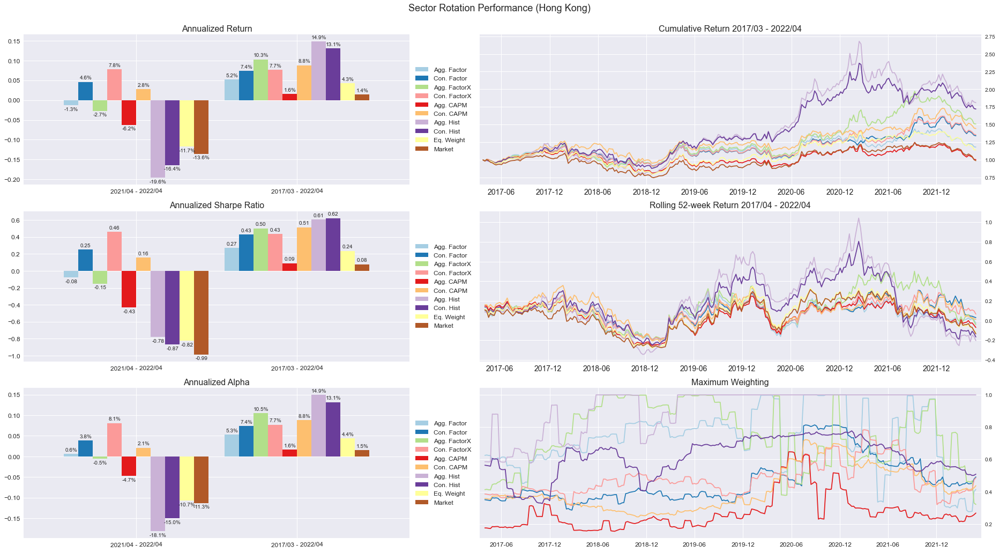

NOTE: figure not saved


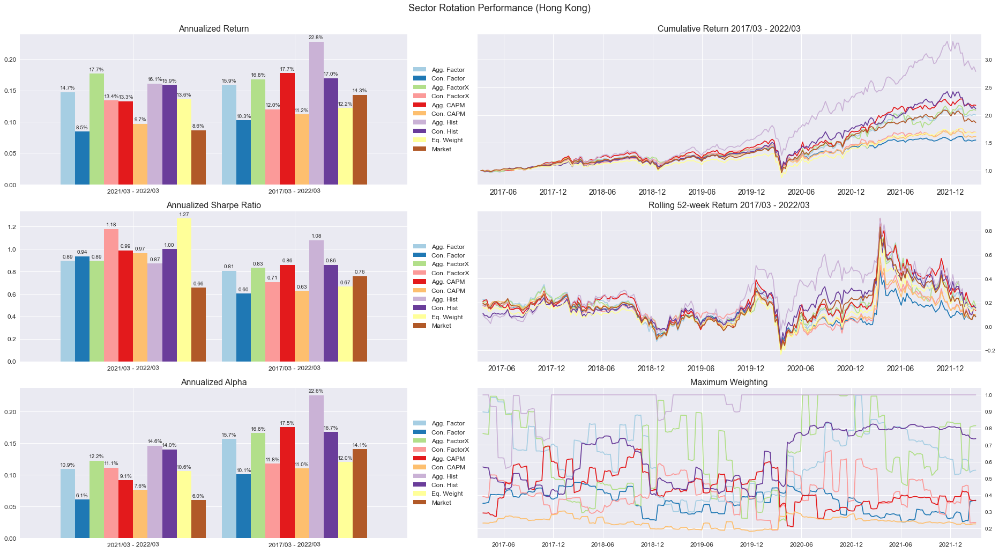

In [107]:
for code in ['hk', 'cn', 'us']:
    level = 'sector'
    method = ['factor','factorx','capm','hist']
    df_all = get_performances(code, level, method, gamma_list=[2,8])
    df_all.columns = ["Agg. Factor", "Con. Factor","Agg. FactorX", "Con. FactorX", "Agg. CAPM", "Con. CAPM", "Agg. Hist", "Con. Hist", "Eq. Weight", "Market"]
    max_weight = get_max_weight(code, level, method, gamma_list=[2,8])
    factor_sum_plot(df_all, max_weight, df_all.columns, "Sector Rotation Performance (Hong Kong)", 
                    r".\plots\performance_{}_5.png".format(code), top= True, periods = 52, horizons = (1, 5, 5), bm_code="hk400",
                   save_fig=False)

figure saved at .\plots\performance_us1500_all.png


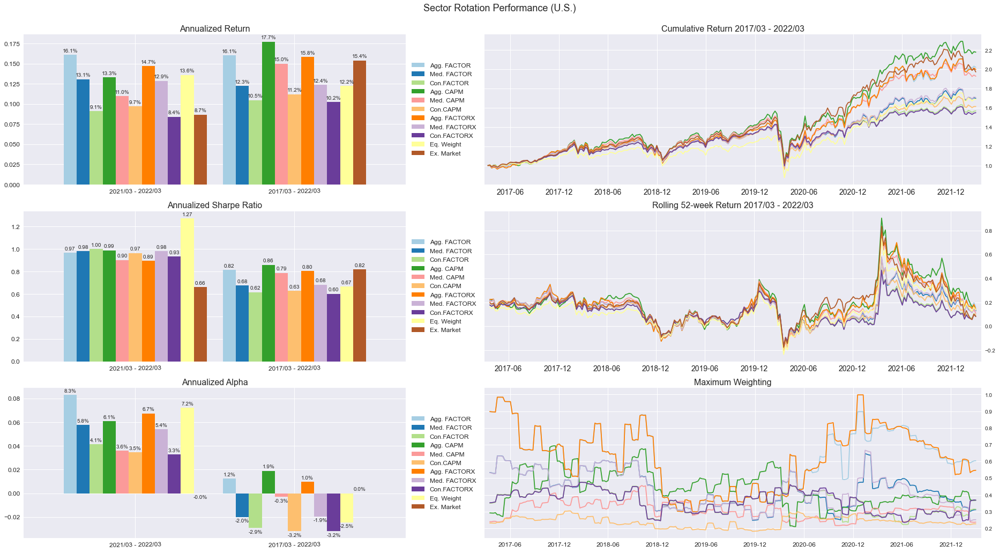

figure saved at .\plots\performance_cn800_all.png


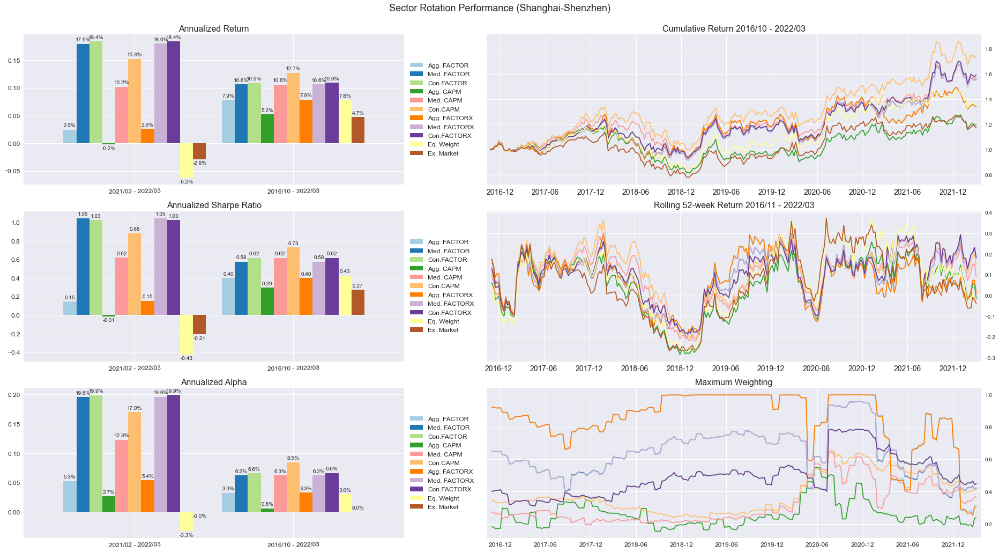

figure saved at .\plots\performance_hk400_all.png


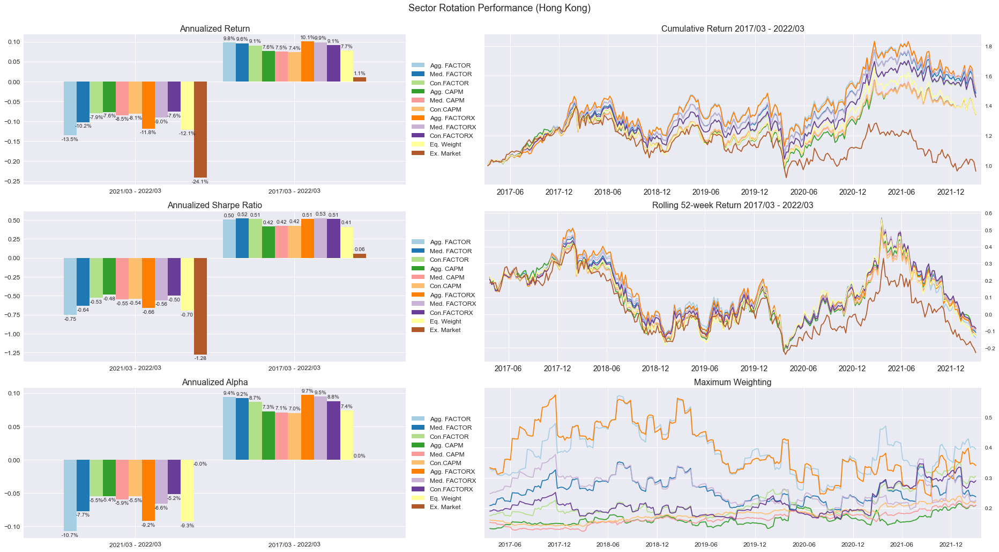

In [42]:
method = ['factor','capm','factorx']
for code in ["us1500", "cn800", "hk400"]:
    df_all = get_performances(code, method, gamma_list=[2,4,8])
    names = []
    for m in method:
        names.extend(["Agg. "+m.upper(),"Med. "+m.upper(), "Con."+m.upper()])
    names.extend(["Eq. Weight", "Ex. Market"])
    df_all.columns = names
    
    weights1 = get_max_weight(code, method, gamma_list=[2,4,8])
    
    if code == "us1500": country = "U.S."
    elif code == "cn800": country = "Shanghai-Shenzhen"
    elif code == "hk400": country = "Hong Kong"
    factor_sum_plot(df_all,weights1,  df_all.columns, "Sector Rotation Performance ({})".format(country), 
                    r".\plots\performance_{}_all.png".format(code), periods = 52, horizons = (1, 5, 5), bm_code=code, top=True)

figure saved at .\plots\performances_cmp_us1500_4.png


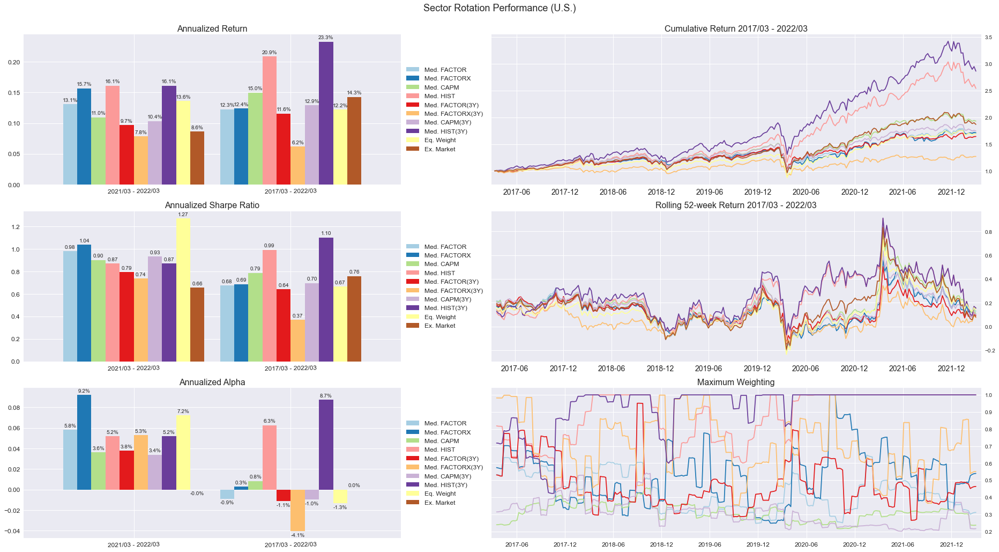

figure saved at .\plots\performances_cmp_cn800_4.png


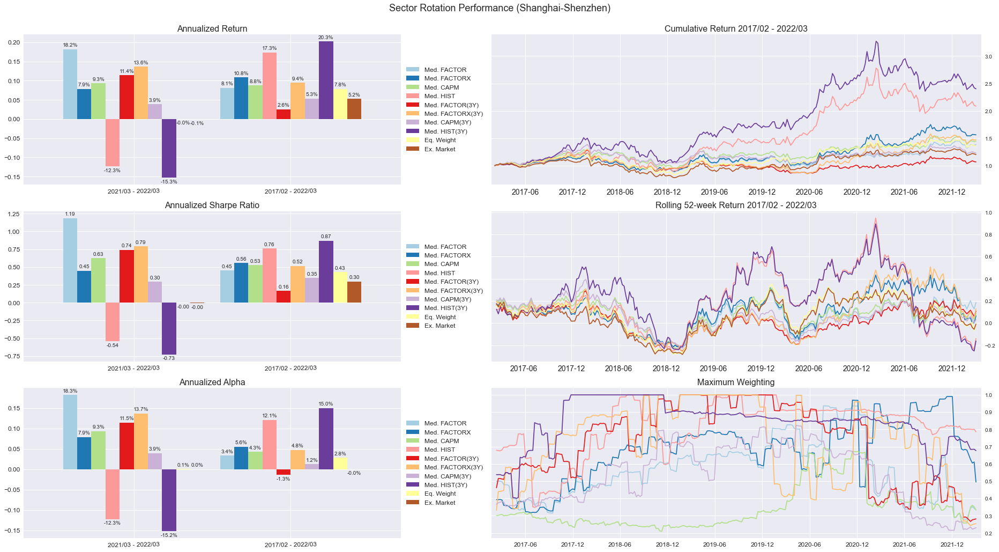

figure saved at .\plots\performances_cmp_hk400_4.png


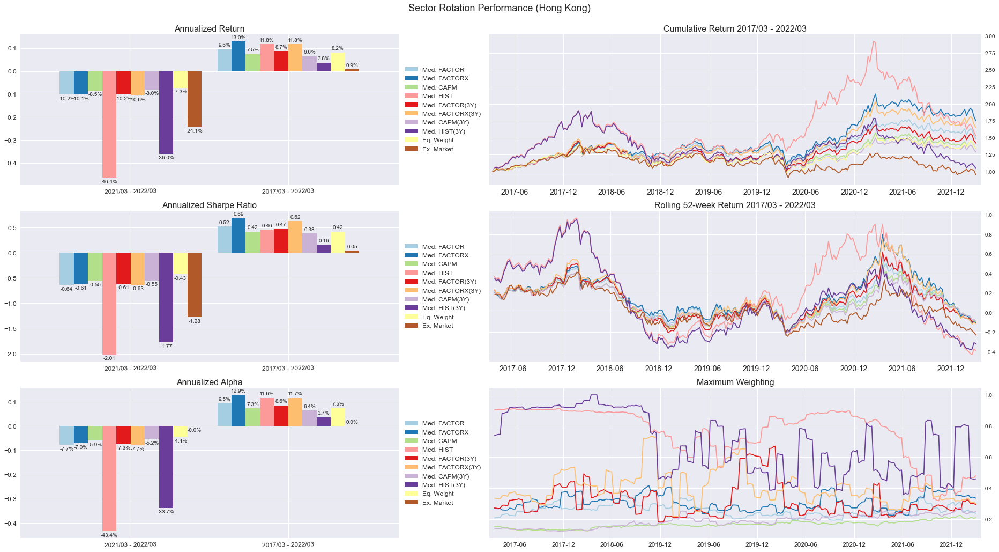

In [170]:
# shorter time window - 3y
for code in ["us1500", "cn800", "hk400"]:
    method = ['factor','factorx','capm','hist']
    gamma = 4
    appetite = "Med. " if gamma == 4 else "Con. "
    df_all = get_performances(code, method, gamma_list=[gamma])
    df_all_3y = get_performances(code, ["{}3".format(m) for m in method], gamma_list=[gamma])
    df_all = df_all.iloc[:,:len(method)].join(df_all_3y, how="left")
    names = [appetite+m.upper() for m in method] + [appetite+m.upper()+"(3Y)" for m in method]
    names.extend(["Eq. Weight", "Ex. Market"])
    df_all.columns = names
    
    weights1 = get_max_weight(code, method, gamma_list=[gamma])
    weights2 = get_max_weight(code, method, suffix="e3", gamma_list=[gamma])
    weights = pd.concat([weights1, weights2], axis=1)
    if code == "us1500": country = "U.S."
    elif code == "cn800": country = "Shanghai-Shenzhen"
    elif code == "hk400": country = "Hong Kong"
    factor_sum_plot(df_all, weights, df_all.columns, "Sector Rotation Performance ({})".format(country), 
                    r".\plots\performances_cmp_{}_{}.png".format(code, gamma), top = True, periods = 52, 
                    horizons = (1, 5, 5), bm_code=code, save_fig=True)

figure saved at .\plots\performances_cmp_cn800_total_2.png


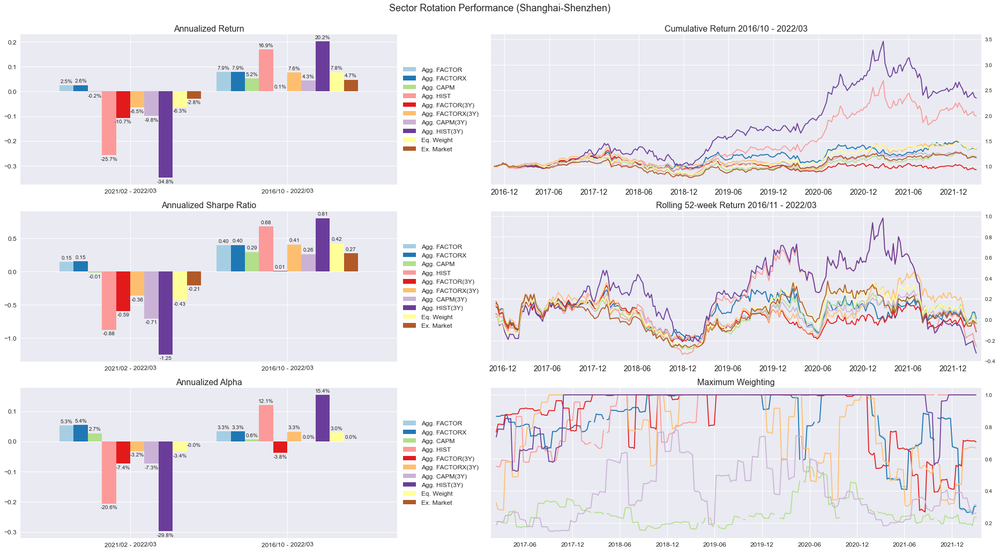

figure saved at .\plots\performances_cmp_cn800_total_8.png


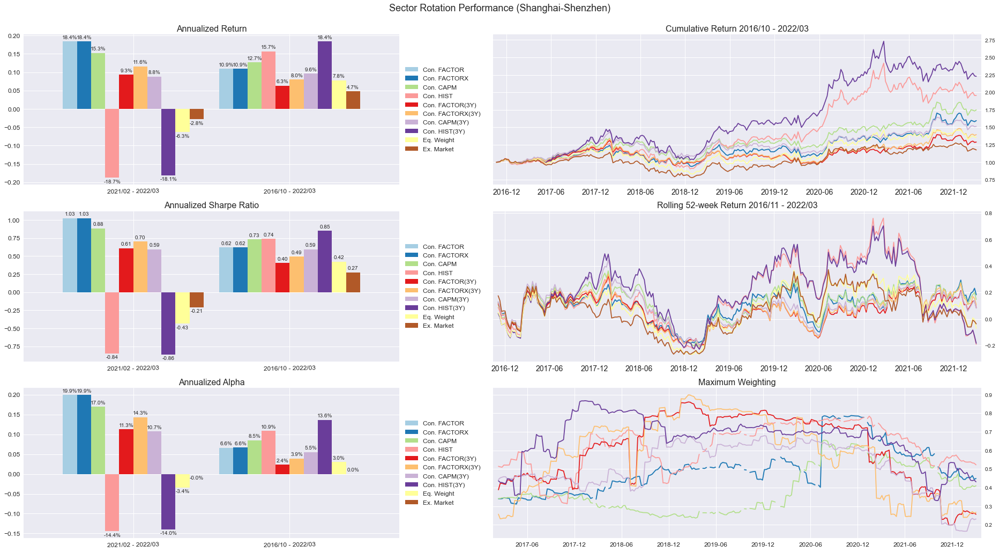

In [41]:
# for total return
for code in ["cn800"]:
    method = ['factor','factorx','capm','hist']
    for gamma in [2,8]:
        appetite = "Agg. " if gamma == 2 else "Con. "
        df_all = get_performances(code, method, gamma_list=[gamma])
        df_all_3y = get_performances(code, ["{}3".format(m) for m in method], gamma_list=[gamma], suffix="t")
        df_all = df_all.iloc[:,:len(method)].join(df_all_3y, how="left")
        names = [appetite+m.upper() for m in method] + [appetite+m.upper()+"(3Y)" for m in method]
        names.extend(["Eq. Weight", "Ex. Market"])
        df_all.columns = names

        weights1 = get_max_weight(code, method, gamma_list=[gamma])
        weights2 = get_max_weight(code, method, suffix="t3", gamma_list=[gamma])
        weights = pd.concat([weights1, weights2], axis=1)
        if code == "us1500": country = "U.S."
        elif code == "cn800": country = "Shanghai-Shenzhen"
        elif code == "hk400": country = "Hong Kong"
        factor_sum_plot(df_all, weights, df_all.columns, "Sector Rotation Performance ({})".format(country), 
                        r".\plots\performances_cmp_{}_total_{}.png".format(code, gamma), top = True, periods = 52, 
                        horizons = (1, 5, 5), bm_code=code, save_fig=True)

figure saved at .\plots\performance_us1500_all_conditional.png


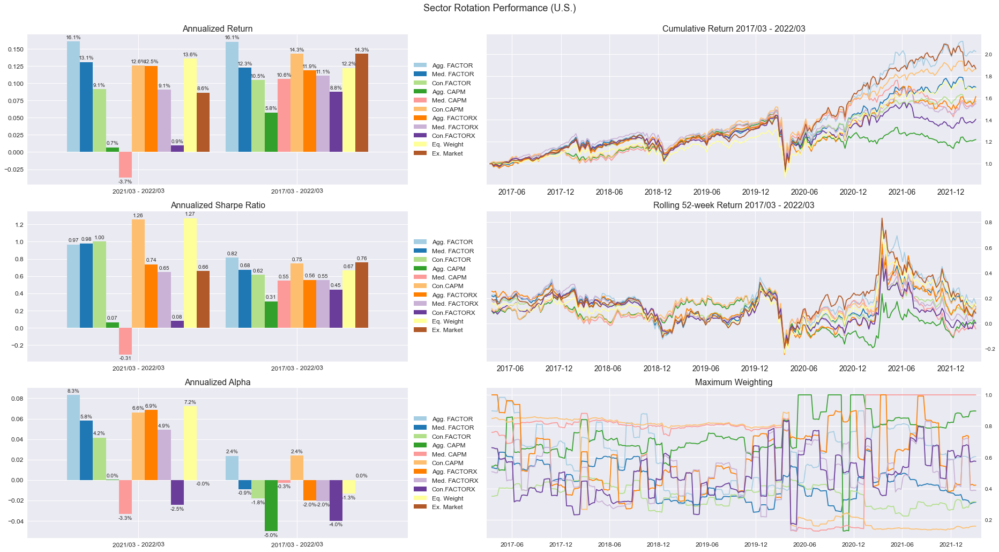

figure saved at .\plots\performance_cn800_all_conditional.png


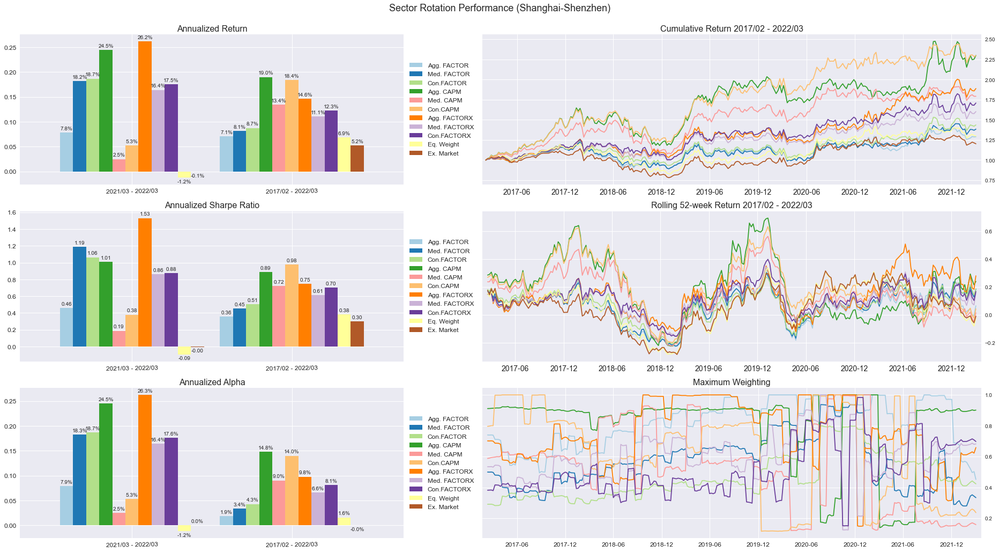

figure saved at .\plots\performance_hk400_all_conditional.png


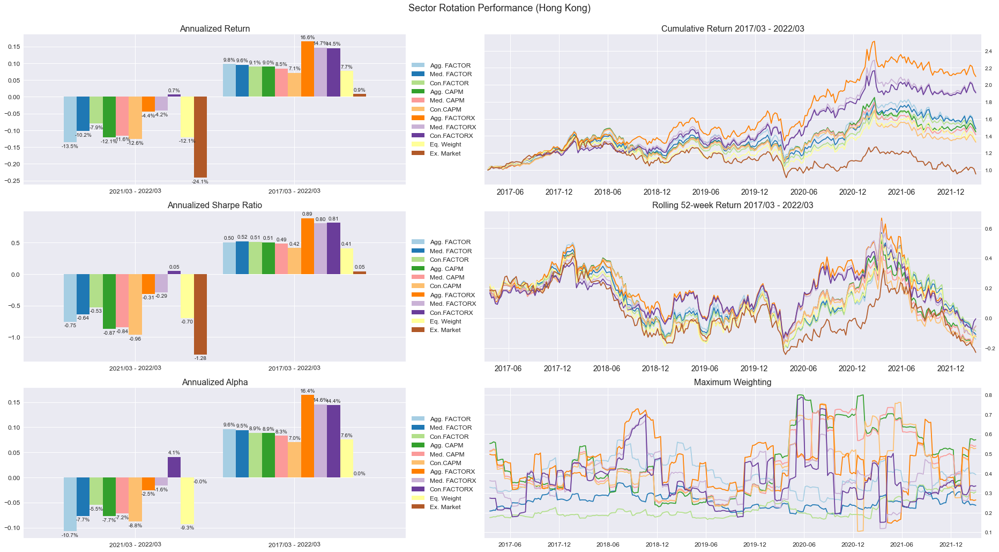

In [180]:
# for conditional - all
method = ['factor','capm','factorx']
for code in ["us1500", "cn800", "hk400"]:
    df_all = get_performances(code, method, gamma_list=[2,4,8], suffix="c")
    names = []
    for m in method:
        names.extend(["Agg. "+m.upper(),"Med. "+m.upper(), "Con."+m.upper()])
    names.extend(["Eq. Weight", "Ex. Market"])
    df_all.columns = names
    
    weights1 = get_max_weight(code, method, gamma_list=[2,4,8], suffix="c")
    
    if code == "us1500": country = "U.S."
    elif code == "cn800": country = "Shanghai-Shenzhen"
    elif code == "hk400": country = "Hong Kong"
    factor_sum_plot(df_all,weights1, df_all.columns, "Sector Rotation Performance ({})".format(country), 
                    r".\plots\performance_{}_all_conditional.png".format(code), periods = 52, horizons = (1, 5, 5), 
                    bm_code=code, top=True, save_fig=True)

figure saved at .\plots\performances_cmp_cn800_conditional_2.png


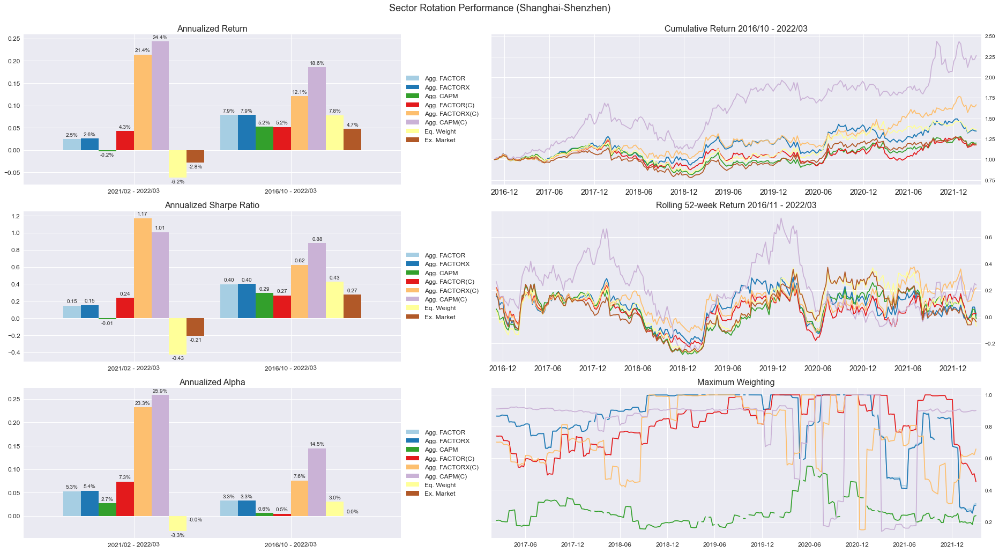

figure saved at .\plots\performances_cmp_cn800_conditional_4.png


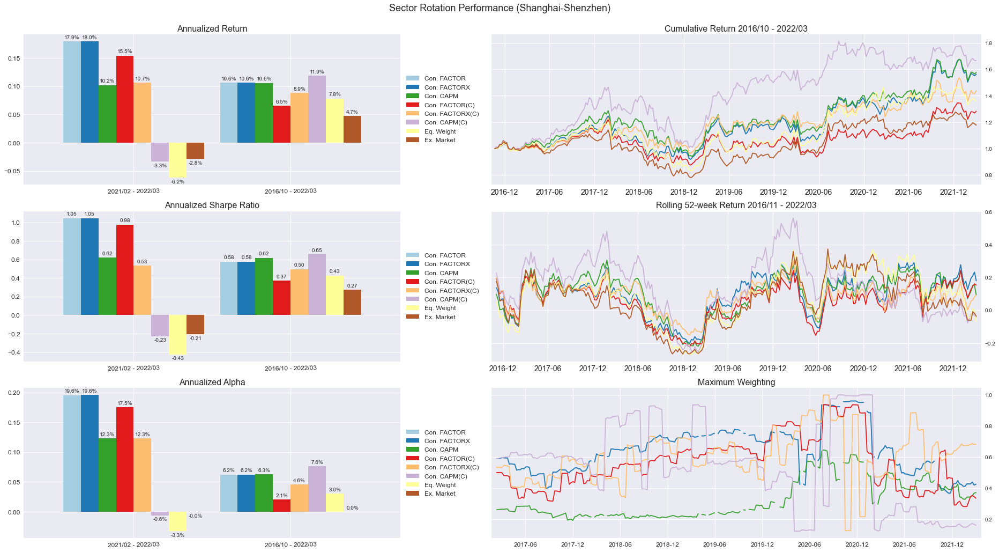

figure saved at .\plots\performances_cmp_cn800_conditional_8.png


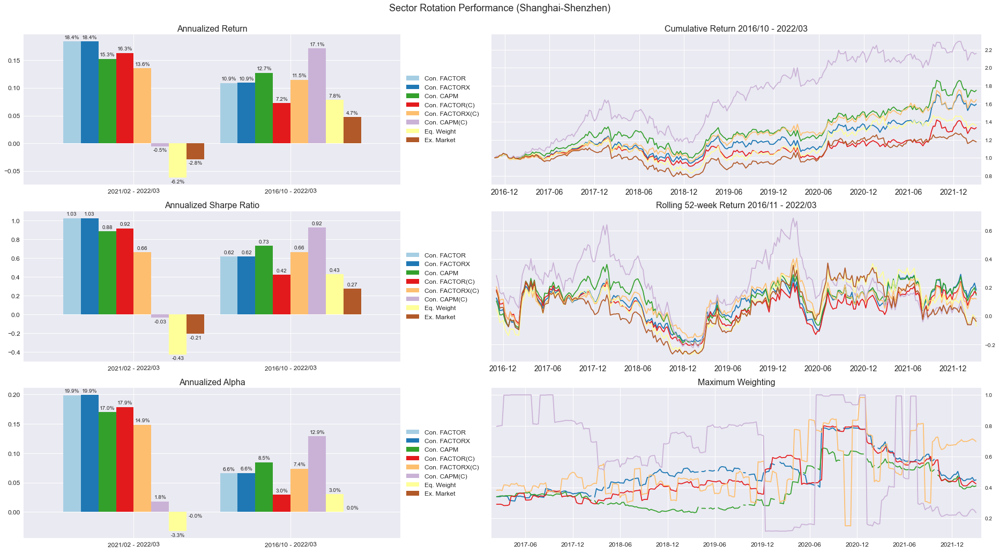

figure saved at .\plots\performances_cmp_hk400_conditional_2.png


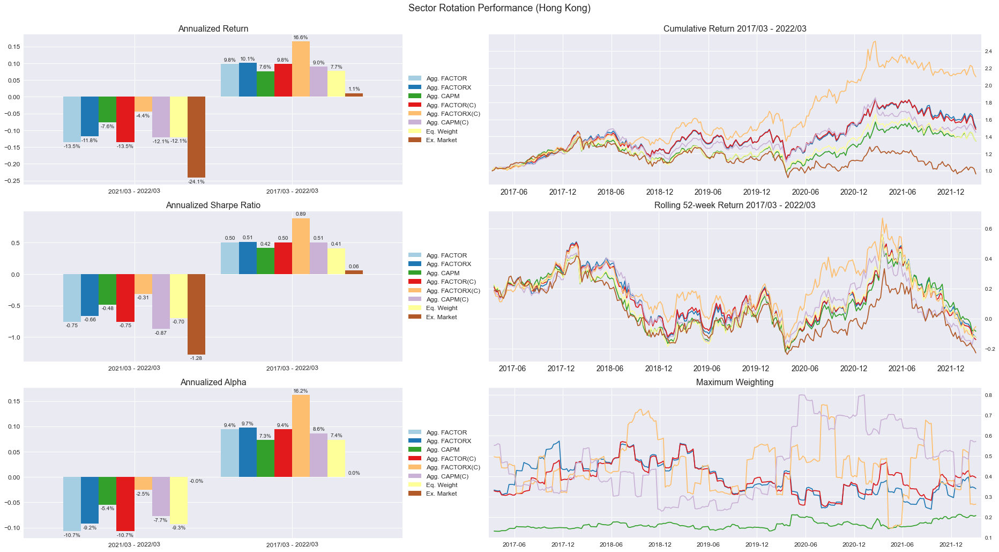

figure saved at .\plots\performances_cmp_hk400_conditional_4.png


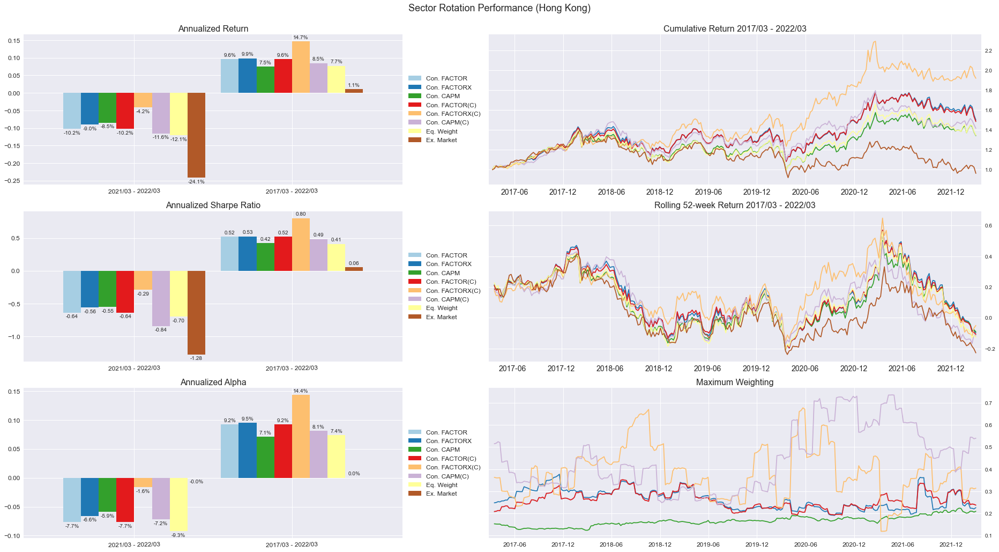

figure saved at .\plots\performances_cmp_hk400_conditional_8.png


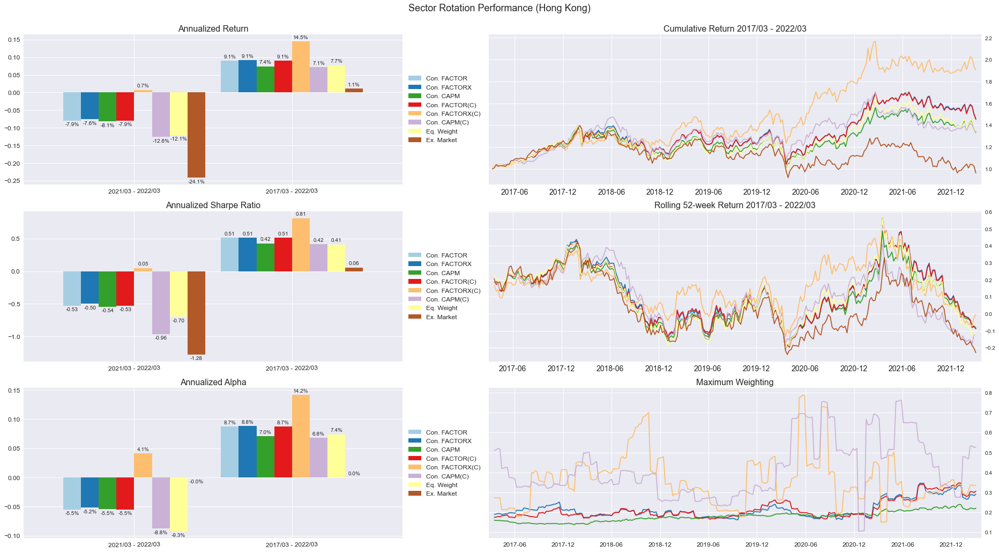

figure saved at .\plots\performances_cmp_us1500_conditional_2.png


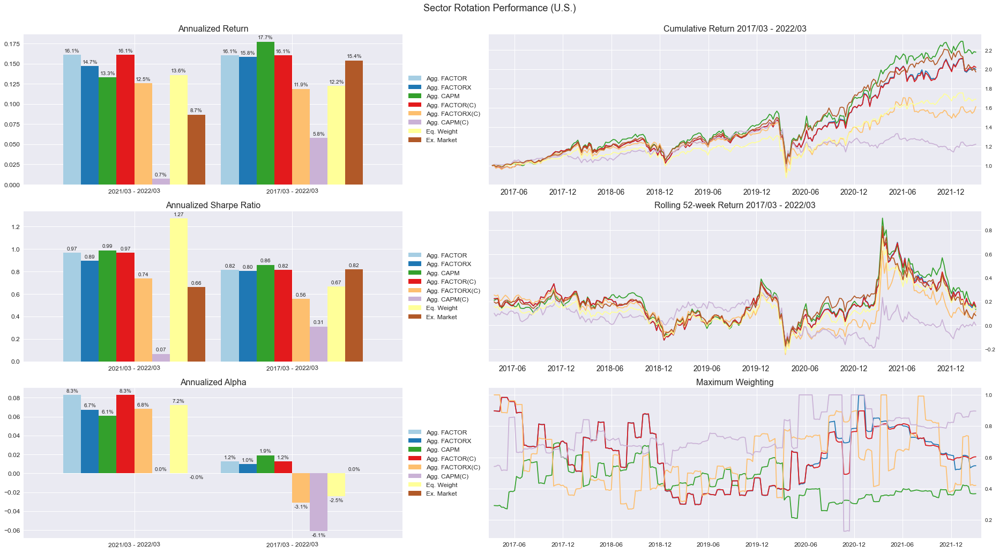

figure saved at .\plots\performances_cmp_us1500_conditional_4.png


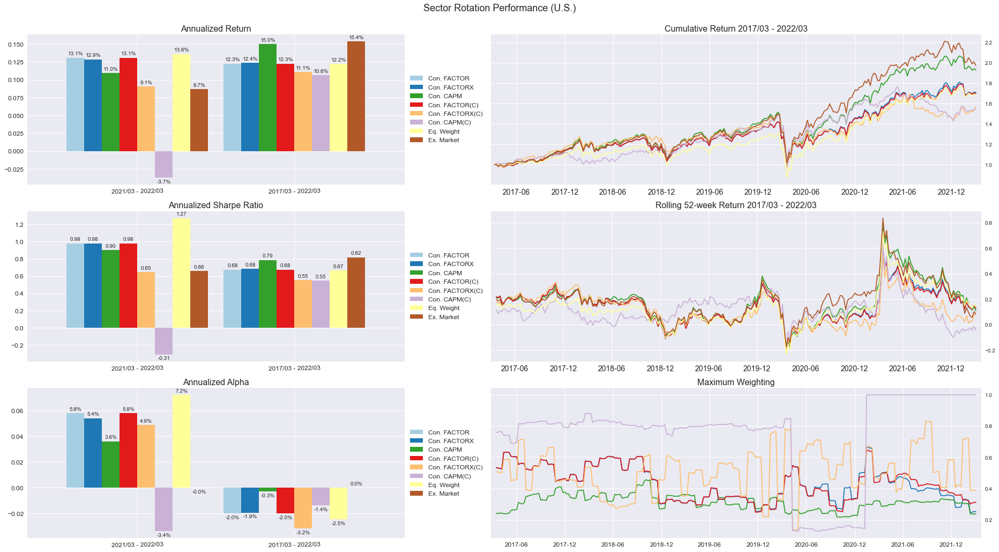

figure saved at .\plots\performances_cmp_us1500_conditional_8.png


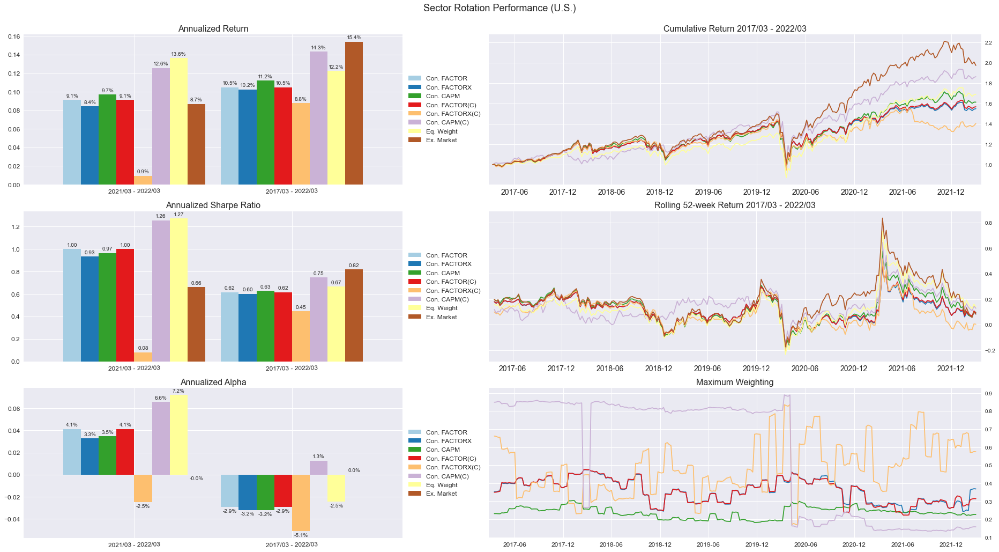

In [40]:
# for conditional - cmp
for code in ["cn800", "hk400", "us1500"]:
    method = ['factor','factorx','capm']
    for gamma in [2,4,8]:
        appetite = "Agg. " if gamma == 2 else "Con. "
        df_all = get_performances(code, method, gamma_list=[gamma])
        df_all_3y = get_performances(code, method, gamma_list=[gamma], suffix="c")
        df_all = df_all.iloc[:,:len(method)].join(df_all_3y, how="left", rsuffix="_")
        names = [appetite+m.upper() for m in method] + [appetite+m.upper()+"(C)" for m in method]
        names.extend(["Eq. Weight", "Ex. Market"])
        df_all.columns = names

        weights1 = get_max_weight(code, method, gamma_list=[gamma])
        weights2 = get_max_weight(code, method, suffix="c",gamma_list=[gamma])
        weights = pd.concat([weights1, weights2], axis=1)
        if code == "us1500": country = "U.S."
        elif code == "cn800": country = "Shanghai-Shenzhen"
        elif code == "hk400": country = "Hong Kong"
        factor_sum_plot(df_all, weights, df_all.columns, "Sector Rotation Performance ({})".format(country), 
                        r".\plots\performances_cmp_{}_conditional_{}.png".format(code, gamma), top = True, periods = 52, 
                        horizons = (1, 5, 5), bm_code=code, save_fig=True)

### Sector Returns

NOTE: figure not saved


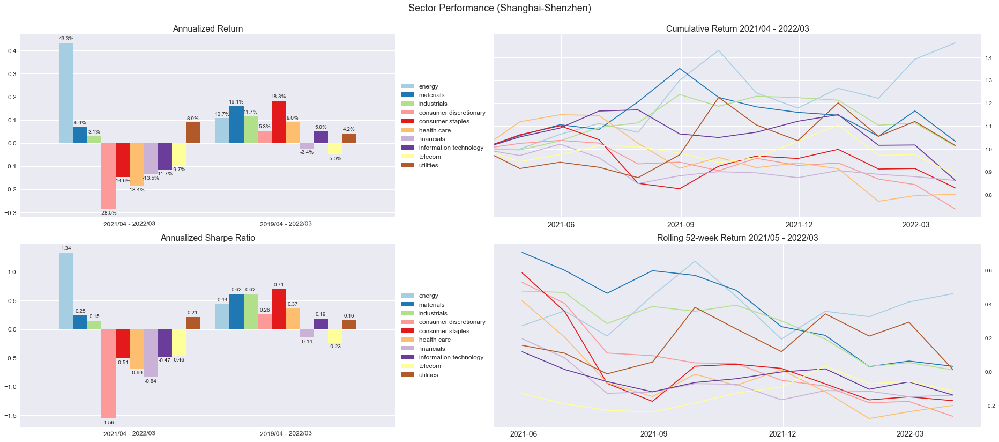

NOTE: figure not saved


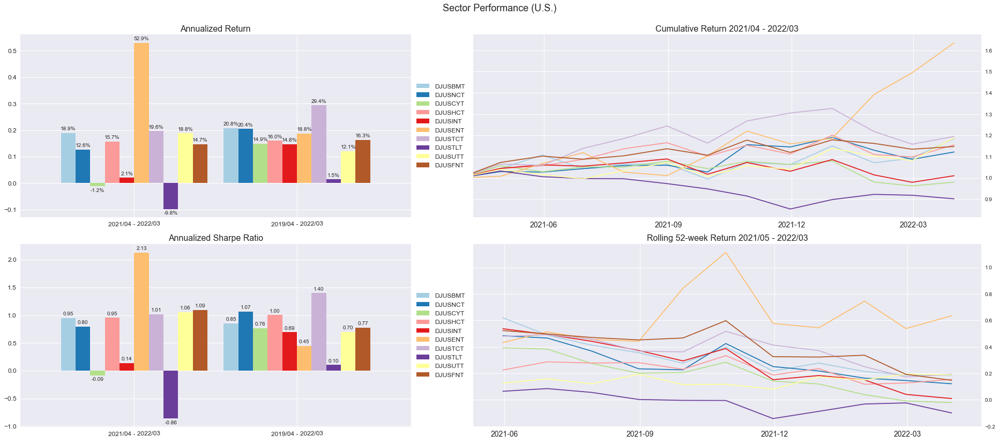

NOTE: figure not saved


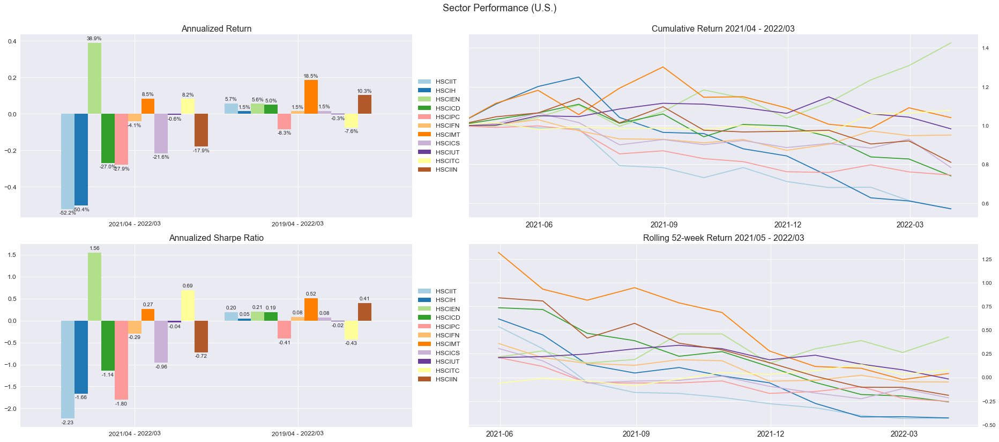

In [22]:
# Shanghai-Shenzhen
data = pd.read_csv(r".\input\sector\csi_sectors_monthly.csv", index_col=0)
data.index = pd.to_datetime(data.index)
factor_sum_plot(data, data.columns, data.columns, "Sector Performance (Shanghai-Shenzhen)", r".\plots\sector_cn.png", save_fig=False)

# US
data = pd.read_csv(r".\input\sector\dj_sectors_monthly.csv", index_col=0)
data.index = pd.to_datetime(data.index)
factor_sum_plot(data, data.columns, data.columns, "Sector Performance (U.S.)", r".\plots\sector_us.png", save_fig=False)

# Hong Kong
data = pd.read_csv(r".\input\sector\hsci_sectors_monthly.csv", index_col=0)
data.index = pd.to_datetime(data.index)
factor_sum_plot(data, data.columns, data.columns, "Sector Performance (U.S.)", r".\plots\sector_hk.png", save_fig=False)


### Industry Group Returns

In [48]:
data = pd.read_csv(r'.\input\sector\hk_industry_group_weekly.csv',index_col=0)
data.index = pd.to_datetime(data.index)

In [46]:
sr = data.iloc[-52*3:,:].mean()/data.iloc[-52*3:,:].std()
sectors = data.columns[(sr.rank()<=5)|(sr.rank()>=18)]

NOTE: figure not saved


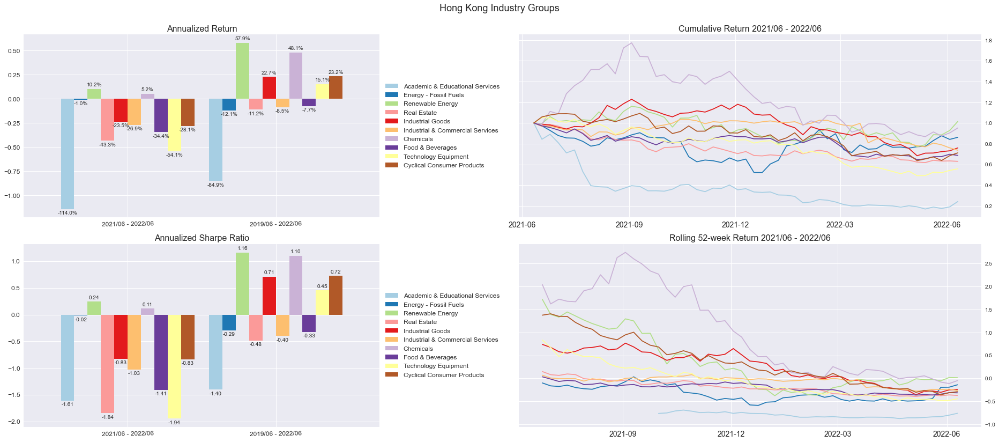

In [47]:
data1 = data[sectors]
names = list(map(lambda x: mdict[x], data1.columns))
factor_sum_plot(data1, None, names, 
                    'Hong Kong Industry Groups', '', save_fig = False, 
                    periods = 52, horizons = (1, 3, 1), 
                    bm_code = None, top = False)

### Archive

In [23]:
# plots for monthly data
# NOT IN USE - ARCHIVE
# code = "hk"
# data = read_factor(code)
# factor_sum_plot(data, factorcodes, factornames,  "Factor Performance Summary (Hong Kong)", "factor_summary_{}.png".format(code))

# code = "us"
# data = read_factor(code)
# factor_sum_plot(data, factorcodes, factornames,  "Factor Performance Summary (U.S.)", "factor_summary_{}.png".format(code))

# code = "cn"
# data = read_factor(code)
# factor_sum_plot(data,  factorcodes, factornames, "Factor Performance Summary (Shanghai-Shenzhen.)", "factor_summary_{}.png".format(code))

In [24]:
def factor_ret_plot(data, factorcodes, factornames, fig_title, fig_path):
    ann_ret = lambda x: (x+1).prod()**(12/len(x)) - 1
    ann_vol = lambda x: x.std()*(12**0.5)
    sr = lambda x: ann_ret(x)/ann_vol(x)
    
    # set grid layout
    plt.style.use('seaborn')
    fig, axe = plt.subplots(ncols = 1, nrows = 1, figsize=(22,10)) #gridspec_kw = {'height_ratios':[1, 4]}, 

    cum_ret = data[factorcodes].iloc[-61:,0]+1
    cum_ret.iloc[0, :] = np.ones(len(factorcodes))
    tick3 = " - ".join([cum_ret.index[-60].strftime("%Y/%m"),cum_ret.index[-1].strftime("%Y/%m")])
    cum_ret.index = mdates.date2num(cum_ret.index)
    cum_ret.cumprod().plot(ax = axe, colormap = "Paired", fontsize = 14, grid=True)
    axe.set_xlabel("")
    axe.set_xlim([data.index[-62],data.index[-1]+pd.Timedelta(days=140)])
    axe.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(12)))
    axe.legend(factornames, ncol=1, loc="upper left", fontsize = 12)
    
    _axe = axe.twinx()
    axe.yaxis.set_tick_position("left")
    _axe.xaxis.set_tick_position("right")
    data[factorcodes].iloc[-61:,0].plot(kind = 'bar', ax = axe)
    
    for i in range(len(factorcodes)):
        height = (data[factorcodes].iloc[-60:,:]+1).prod()[i]
        text = "{:.1%}".format(height)
        ax3.annotate(xy=[data.index[-1]+pd.Timedelta(days=30), height], xytext = (1,0), 
                     textcoords = 'offset points', text = text, color="tab:grey", fontsize = 12)
    ax3.set_title("Cumulative Return {}".format(tick3), size = 16)
    
    fig.suptitle(fig_title, fontsize = 18)
    fig.tight_layout(rect = [0, 0.03, 1, 0.98])
    plt.savefig(fig_path)
    plt.show()

In [25]:
data = pd.read_csv(
    r".\sector-rotation-data\hsci_sectors_monthly.csv", index_col=0)
data.index = pd.to_datetime(data.index)
factor_sum_plot(data, data.columns, data.columns,
                "Sector Performance (Hong Kong)", "hk_sum.png")

FileNotFoundError: [Errno 2] No such file or directory: '.\\sector-rotation-data\\hsci_sectors_monthly.csv'

In [ ]:
# test for b_weight = 1, gamma = 2, 4 and 8 (factor and capm) + market + EW
def get_performances3y(code, methods):
    ls = []
    for method in methods:
        data = pd.read_csv(r".\performances\weekly3y\{}_quadprog_{}e.csv".format(code, method), index_col = 0)
        data = data[data.gamma_op.isin([2,8])&(data.b_weight==1)]
        data = data.pivot(columns = "gamma_op", values = "0")
        data.columns = ["{}({})".format(method, i) for i in data.columns]
        ls.append(data)
    data_ew = pd.read_csv(r".\performances\weekly3y\{}_quadprog_{}e.csv".format(code, method), index_col = 0)
    data_ew = data_ew.loc[(data_ew.gamma_op == 2) & (data_ew.b_weight == 0), "0"]
    data_ew.name = "ew"
    ls.append(data_ew)
    df_all = pd.concat(ls, axis = 1)
    data_market = pd.read_csv(r".\input\factor\ten_factor_vw_{}_week_5.csv".format(code), index_col = 0)
    data_market["excess market"] = data_market["market"] - data_market["rf"]
    df_all = df_all.join(data_market["excess market"])
    df_all.index = pd.to_datetime(df_all.index)
    return df_all

# code = "us1500"
# method = ['factor','capm','hist']
# df_all = get_performances3y(code, method)
# df_all.columns = ["Agg. Factor", "Con. Factor", "Agg. CAPM", "Con. CAPM", "Agg. Hist", "Con. Hist", "Eq. Weight", "Ex. Market"]
# factor_sum_plot(df_all, df_all.columns,  df_all.columns, "Sector Rotation Performance (U.S.)", 
#                 r".\plots\performance_{}_5.png".format(code), periods = 52, horizons = (1, 5, 5))
